# Geospatial Data Science - EEPS 440/460

# Lecture 14

# Cluster Analysis I

---

# Class Reading:

[Chapter 7 in *Introduction to Data Mining* (Tan et al., 2019)](./Lec_14_clustering_reading_ch7_tan2019.pdf)

---

# Motivation

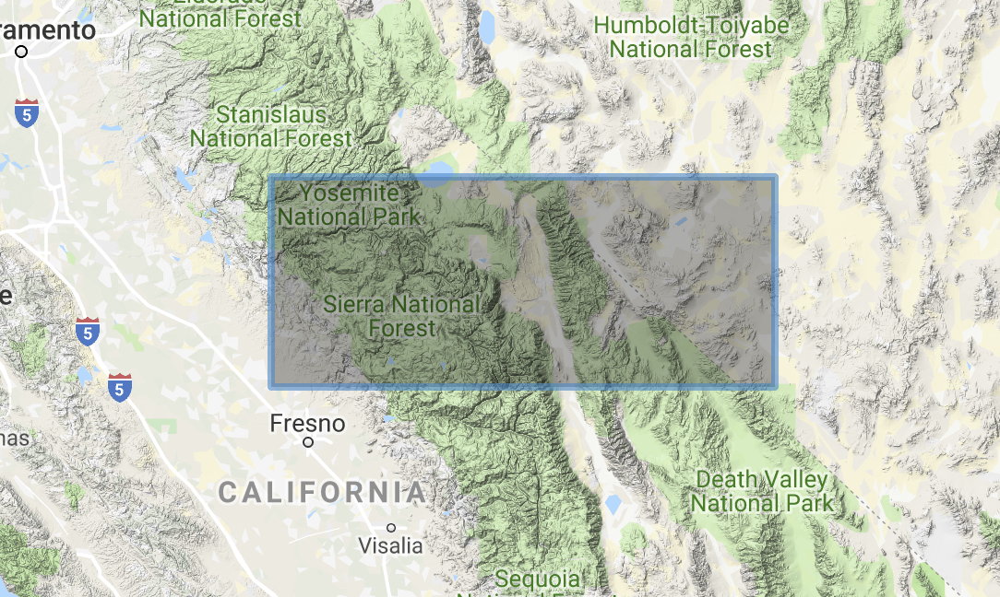

In [ ]:
%%bash
#Extract data for a chosen region
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/NED/NED.vrt ../Workspace/dem.tif
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/PRISM/PRISM_ppt_30yr_normal_800mM2_annual/PRISM_ppt_30yr_normal_800mM2_annual_bil.bil ../Workspace/ppt.tif
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/PRISM/PRISM_tmean_30yr_normal_800mM2_annual/PRISM_tmean_30yr_normal_800mM2_annual_bil.bil ../Workspace/tmean.tif
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/USGS30m/treecover2010/40N_120W_treecover2010_v3.tif ../Workspace/treecover.tif
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/USGS30m/bare2010/40N_120W_bare2010_v3.tif ../Workspace/barecover.tif
gdalwarp -overwrite -r average -te -120 36 -117 38 -tr 0.01 0.01 ../data/POLARIS/sand_0_5.vrt ../Workspace/sand.tif

In [ ]:
#Import data
import rasterio
import numpy as np
# create a dictionary data
data = {}
# load the data into our dictionary
file = '../Workspace/dem.tif'
data['dem'] = rasterio.open(file).read(1)
file = '../Workspace/ppt.tif'
data['ppt'] = rasterio.open(file).read(1)
file = '../Workspace/tmean.tif'
data['tmean'] = rasterio.open(file).read(1)
file = '../Workspace/treecover.tif'
data['tcf'] = rasterio.open(file).read(1)
file = '../Workspace/barecover.tif'
data['bcf'] = rasterio.open(file).read(1)
file = '../Workspace/sand.tif'
data['sand'] = rasterio.open(file).read(1)
#Create lats/lons arrays
fp = rasterio.open(file)
lons = np.linspace(fp.bounds.left+fp.res[0]/2, fp.bounds.right-fp.res[0]/2, data['sand'].shape[1])
lats = np.linspace(fp.bounds.bottom+fp.res[1]/2, fp.bounds.top-fp.res[1]/2, data['sand'].shape[0])
(lons,lats) = np.meshgrid(lons,lats)
#(lons,lats) = np.meshgrid(lats,lons)
data['lon'] = lons[:]
data['lat'] = np.flipud(lats[:])
print(lons.shape)
print(data['sand'].shape)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
info = {'dem':{'cmap':'terrain','title':'Elevation (m)'},
        'ppt':{'cmap':'jet','title':'Precipitation (mm/year)'},
        'sand':{'cmap':'YlOrBr','title':'Sand (%)'},
        'tcf':{'cmap':'YlGn','title':'Tree cover fraction (%)'},
        'bcf':{'cmap':'YlGn_r','title':'Bare soil fraction (%)'},
        'tmean':{'cmap':'coolwarm','title':'Temperature (C)'},
        'lat':{'cmap':'Blues','title':'Latitude'},
        'lon':{'cmap':'Reds','title':'Longitude'}}
plt.figure(figsize=(8,14))
i = 0
for var in data:
    i += 1
    plt.subplot(4,2,i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(data[var],cmap=plt.get_cmap(info[var]['cmap']))
    cb = plt.colorbar(orientation='horizontal',pad=0.03)
    cb.ax.tick_params(labelsize=16)
    plt.title(info[var]['title'],fontsize=20)
plt.tight_layout()
plt.show()

## Let's compare these variables using scatter plots

In [ ]:
plt.figure(figsize=(15,15))
i = 0
for v1 in data:
    for v2 in data:
        i += 1
        plt.subplot(8,8,i)
        plt.title('%s vs %s' % (v2,v1))
        plt.plot(data[v1],data[v2],'bo',alpha=0.01)
plt.tight_layout()
plt.show()

That's messy...

# Focus: Bare cover fraction vs Elevation

In [ ]:
plt.figure(figsize=(14,6))
plt.plot(data['dem'],data['bcf'],'bo',alpha=0.1)
plt.xlabel('Elevation (m)',fontsize=20)
plt.ylabel('Bare cover fraction (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()        

If I asked you to divide the "dove" into four components, what would they be??

# Enter clustering!

In [ ]:
import sklearn.mixture
#Normalize the data
v1 = data['dem'].reshape(data['dem'].size)
v2 = data['bcf'].reshape(data['bcf'].size)
v1 = (v1-np.min(v1))/(np.max(v1)-np.min(v1))
v2 = (v2-np.min(v2))/(np.max(v2)-np.min(v2))
#Create data for scikit-learn
X = np.stack((v1,v2)).T
#Define the number of clusters
k = 4
np.random.seed(1)
model = sklearn.mixture.GaussianMixture(n_components=k)
#Subsample data to fit the model (minimize computation)
idx = np.random.choice(np.arange(X.shape[0]),5000, replace=False)
Xs = X[idx,:]
#Fit the model
model.fit(Xs)
#Predict the clusters on all the data
clusters = model.predict(X)
plt.figure(figsize=(14,6))
plt.title('Assigned clusters',fontsize=20)
plt.scatter(data['dem'].reshape(data['dem'].size),data['bcf'].reshape(data['bcf'].size),
            c=clusters,cmap=plt.get_cmap('viridis'),alpha=0.03)
cb = plt.colorbar()
#Ensure the alpha of the colorbar is 1.0
cb.solids.set_alpha(1.0)
plt.xlabel('Elevation (m)',fontsize=20)
plt.ylabel('Bare cover fraction (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

We are going to spend some time in the "weeds" with clustering over the next week and a half.

# Cluster analysis

*"Cluster analysis groups data objects based on information found only in the data that describes the objects and their relationships. The goal is that the objects within a group be similar (or related) to one another and different from (or unrelated to) the objects in other groups. The greater the similarity (or homogeneity) within a group and the greater the difference between groups, the better or more distinct the clustering."* (Tan et al., 2019)

## Available resources 

For this module I will be drawing heavily from Chapter 7 in *Introduction to Data Mining* (Tan et al., 2019). It is a nice, readable introduction to the material. 

If you want to dive deeper, I strongly suggest you check out the chapter on Unsupervised Learning in "The Elements of Statistical Learning" which you can access online. 

# But why do we care about clustering data? 

## Clustering for understanding

*"Classes, or conceptually meaningful groups of objects that share common characteristics, play an important role in how people analyze and describe the world. Indeed, human beings are skilled at dividing objects into groups (clustering) and assigning particular objects to these groups (classification)."* (Tan et al., 2019) 

Examples: 

* Identify the evolution of drought clusters in space and time.
* Understand the connectivity between hydrologic and ecologic data.
* Define the drivers of the observed heterogeneity over the land surface.

## Clustering for utility

*"Cluster analysis provides an abstraction from individual data objects to the clusters in which those data objects reside. Additionally, some clustering techniques characterize each cluster in terms of a cluster prototype; i.e., a data object that is representative of the objects in the cluster. These cluster prototypes can be used as the basis for a number of additional data analysis or data processing techniques."* (Tan et al., 2019)

Examples:

* Compress spatial data to minimize storage requirements
* Leverage repetitive patterns over the land surface to enable faster hydrologic models
* Organize and summarize data for ease of access and interpretation

# Types of clustering

## Hierarchical vs partitional

* **Partitional** - Division of the data into non-overlapping clusters such that each data point is exactly in one cluster (e.g., K-means) 
* **Hierarchical** - Division of the data into nested clusters to form a tree (e.g., Agglomerative Hierarchical Clustering)

## Exclusive vs fuzzy

* **Exclusive** - Each data point is assigned to only one cluster (K-means)
* **Fuzzy** - Each data point belongs to every cluster with a weight or probability (e.g., Gaussian Mixture Models)

# Complete vs partial

* **Complete** - Every data point is assigned to at least one cluster (e.g., K-means)
* **Partial** - Data points can be left out if the assignment is unclear (e.g., DBSCAN)

## The definition of a cluster can become fairly subjective

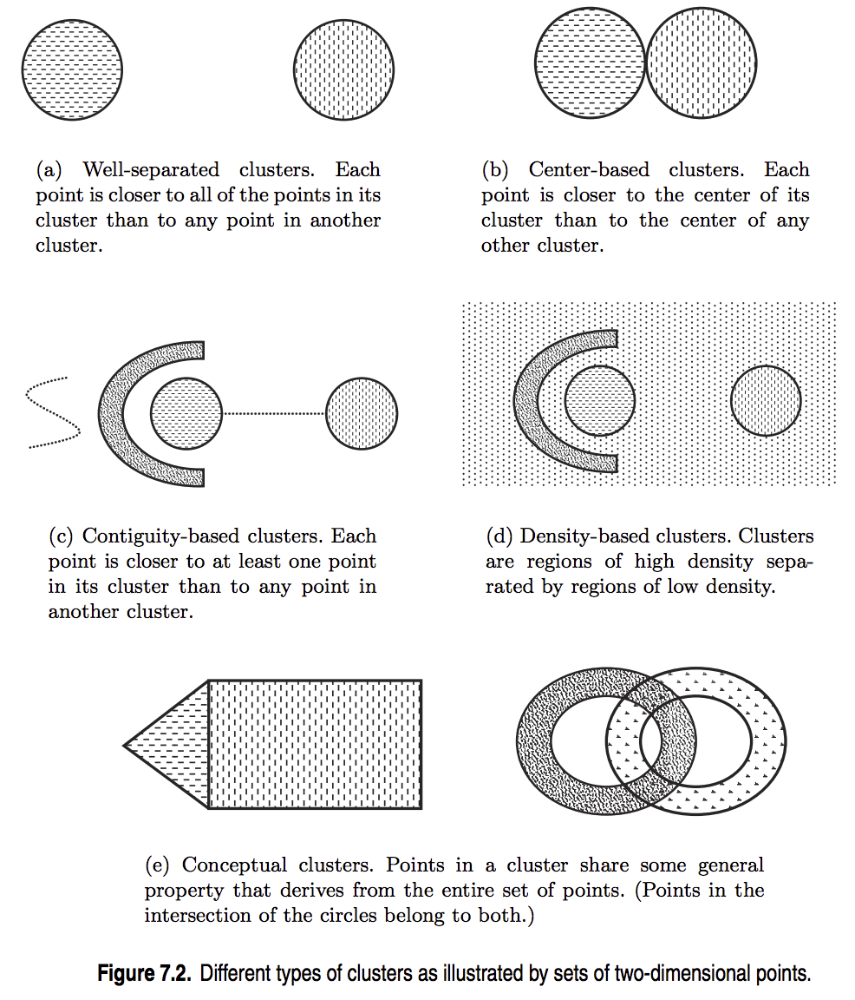

# K-Means

K-means partitions n-dimensional space into $k$ clusters where each cluster is defined by a centroid which is the mean of the points that belong to the cluster. 

The assignment of a point to a cluster is defined by finding the centroid that is closest to a given point. 

## K-means algorithm

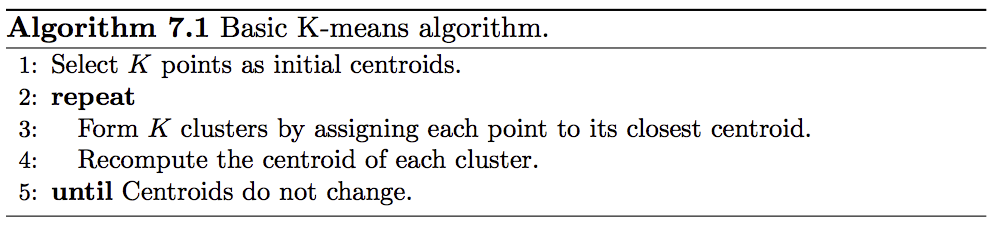

You are going to code this up from scratch in your homework

## K-means convergence example

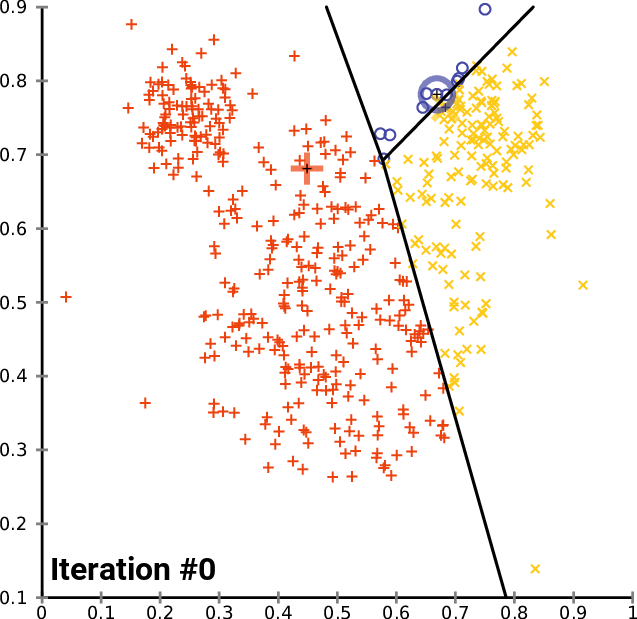

Source: https://en.wikipedia.org/wiki/File:K-means_convergence.gif

## Initial step: Initialize centroids

* The most naive approach is to set *k* randomly sampled points from our data as the centroids.
* Another approach is to ensure the initial centroids are "spread out" (e.g., kmeans++)

# K-Means Objective Function: Sum of Squared Errors (SSE)

In K-Means clustering, the objective function is the **sum of squared errors (SSE)**, which quantifies the total variance within clusters. It is given by:

$$
\text{SSE} = \sum_{i=1}^{k} \sum_{x \in C_i} \sum_{l=1}^{n} \left(x_{l} - c_{i,l}\right)^2
$$

where:
- $k$ is the number of clusters,
- $C_i$ represents the set of all data points $x$ assigned to cluster $i$, meaning they are closest to centroid $c_i$,
- $n$ is the number of dimensions (features) in the dataset,
- $c_{i,l}$ is the mean value (centroid) of all points in $C_i$ along the $l$-th dimension.

## The K-Means Algorithm

The K-Means algorithm iteratively minimizes the SSE through two key steps:

1. **Assignment Step:** Assign each data point to the nearest centroid, forming $k$ clusters.
2. **Update Step:** Recompute each centroid as the arithmetic mean of all points assigned to its cluster in Step 1.

### Why Does K-Means Minimize SSE?

Each iteration of K-Means reduces SSE:
- In **Step 1**, reassigning points to their closest centroid reduces intra-cluster variance.
- In **Step 2**, updating the centroids minimizes the squared distance between cluster members and their respective centroids.

For a deeper mathematical explanation, refer to the readings mentioned at the beginning of the lecture.


# Let's look at an example where K-means works very well

#### 1. Initialize multivariate Gaussians with identical, spherical covariance matrices

In [ ]:
np.random.seed(1)
mean = np.array([2.0,0.1])
cov = np.array([[1.0,0.3],[0.3,1.0]])
X0 = np.random.multivariate_normal(mean,cov,250)
mean = np.array([-5.0,2.0])
cov = np.array([[1.0,0.3],[0.3,1.0]])
X1 = np.random.multivariate_normal(mean,cov,250)
mean = np.array([-5.0,-5.0])
cov = np.array([[1.0,0.3],[0.3,1.0]])
X2 = np.random.multivariate_normal(mean,cov,250)
X = np.concatenate((X0,X1,X2),axis=0)
#Let's plot the synthetic clusters
plt.figure(figsize=(10,10))
plt.plot(X[:,0],X[:,1],'o')
plt.axis('equal')
plt.show()

#### 2. Run K-means on the data

In [ ]:
import sklearn.cluster
#Set 3 clusters
k = 3
model = sklearn.cluster.KMeans(n_clusters=k)
#Fit the model
model.fit(X)
#Predict the clusters on all the data
clusters = model.predict(X)
plt.figure(figsize=(10,10))
plt.scatter(X[:,0],X[:,1],c=clusters,cmap=plt.get_cmap('Paired'))
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1],c='k',s=100)
print(model.cluster_centers_)
plt.axis('equal')
plt.show()

# Example revisited: Non-spherical covariance matrix

#### 1. Initialize multivariate Gaussians with non-spherical covariance matrices

In [ ]:
np.random.seed(1)
mean = np.array([2.0,0.1])
cov = np.array([[1.0,0.9],[0.9,1.0]])
X0 = np.random.multivariate_normal(mean,cov,1000)
mean = np.array([-5.0,2.0])
cov = np.array([[5.0,1.0],[1.0,5.0]])
X1 = np.random.multivariate_normal(mean,cov,1000)
mean = np.array([-5.0,-5.0])
cov = np.array([[1.0,-0.9],[-0.9,1.0]])
X2 = np.random.multivariate_normal(mean,cov,1000)
X = np.concatenate((X0,X1,X2),axis=0)
#Let's plot the synthetic clusters
plt.figure(figsize=(10,10))
plt.plot(X[:,0],X[:,1],'o')
plt.axis('equal')
plt.show()

#### 2. Run K-means on the data

In [ ]:
#Set 3 clusters
k = 3
model = sklearn.cluster.KMeans(n_clusters=k)
#Fit the model
model.fit(X)
#Predict the clusters on all the data
clusters = model.predict(X)
plt.figure(figsize=(10,10))
plt.scatter(X[:,0],X[:,1],c=clusters,cmap=plt.get_cmap('Paired'))
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1],c='k',s=100)
plt.axis('equal')
plt.show()

### Key Point:
K-means works best for clusters that are spherical given that we assign each point to its closest centroid.

# Example revisited: Features with different orders of magnitude

#### 1. Initialize multivariate Gaussians with non-spherical covariance matrices

In [ ]:
np.random.seed(1)
mean = np.array([100.0,1.0])
cov = np.array([[500.0,0.1],[0.1,5.0]])
X0 = np.random.multivariate_normal(mean,cov,1000)
mean = np.array([-5.0,2.0])
cov = np.array([[1.0,0.3],[0.3,1.0]])
X1 = np.random.multivariate_normal(mean,cov,250)
mean = np.array([-5.0,-5.0])
cov = np.array([[1.0,0.3],[0.3,1.0]])
X2 = np.random.multivariate_normal(mean,cov,250)
X = np.concatenate((X0,X1,X2),axis=0)
#Let's plot the synthetic clusters
plt.figure(figsize=(10,10))
plt.plot(X[:,0],X[:,1],'o')
#plt.axis('equal')
plt.show()

#### 2. Run K-means on the data

In [ ]:
#Set 3 clusters
k = 3
model = sklearn.cluster.KMeans(n_clusters=k)
#Fit the model
model.fit(X)
#Predict the clusters on all the data
clusters = model.predict(X)
plt.figure(figsize=(10,10))
plt.scatter(X[:,0],X[:,1],c=clusters,cmap=plt.get_cmap('Paired'))
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1],c='k',s=100)
plt.show()

What could be going on here? Think about what K-means is minimizing. How can we solve this?

## Solution: Normalize the feature space

In [ ]:
# Normalizer by Min and Max
Xn = (X - np.min(X,axis=0))/(np.max(X,axis=0)-np.min(X,axis=0)) 
#Set 3 clusters
k = 3
model = sklearn.cluster.KMeans(n_clusters=k)
#Fit the model
model.fit(Xn)
#Predict the clusters on all the data
clusters = model.predict(Xn)
plt.figure(figsize=(10,10))
plt.scatter(Xn[:,0],Xn[:,1],c=clusters,cmap=plt.get_cmap('Paired'))
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1],c='k',s=100)
plt.show()

Not perfect but definitely much better!

## Large source of uncertainty: Initialization

In [ ]:
Xn = (X - np.min(X,axis=0))/(np.max(X,axis=0)-np.min(X,axis=0)) 
#Set 3 clusters
k = 3
model = sklearn.cluster.KMeans(n_clusters=k,n_init=10)
#Fit the model
model.fit(Xn)
#Predict the clusters on all the data
clusters = model.predict(Xn)
# plot the clusters
plt.figure(figsize=(10,10))
plt.scatter(Xn[:,0],Xn[:,1],c=clusters,cmap=plt.get_cmap('Paired'))
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1],c='k',s=100)
plt.show()

* This is because K-means only finds local minima. Therefore the results might not be optimal. 

* To minimize the uncertainty, run it multiple time and choose the one that does the best job at minimizing the SSE.

* In scikit-learn use n_init parameter to define the number of times it is run. The default is 10, to avoid these issues.

## We are now ready to apply K-means to our 2d data

In [ ]:
import sklearn.cluster
#Bring in the data
v1 = data['dem'].reshape(data['dem'].size)
v2 = data['bcf'].reshape(data['bcf'].size)
#Create data for scikit-learn
X = np.stack((v1,v2)).T
#Define the number of clusters
k = 4
np.random.seed(1)
model = sklearn.cluster.KMeans(n_clusters=k)
#Subsample data to fit the model (minimize computation)
idx = np.random.choice(np.arange(X.shape[0]),5000, replace=False)
Xs = X[idx,:]
#Fit the model
model.fit(Xs)
#Predict the clusters on all the data
clusters = model.predict(X)
# Plot
plt.figure(figsize=(14,6))
plt.title('Assigned clusters',fontsize=20)
plt.scatter(data['dem'].reshape(data['dem'].size),data['bcf'].reshape(data['bcf'].size),
            c=clusters,cmap=plt.get_cmap('viridis'),alpha=0.03)
cb = plt.colorbar()
#Ensure the alpha of the colorbar is 1.0
cb.solids.set_alpha(1.0)
plt.xlabel('Elevation (m)',fontsize=20)
plt.ylabel('Bare cover fraction (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

Wait, what? What is going on here?

## 2D example revisited: Normalize the feature space

In [ ]:
import sklearn.cluster
#Bring in the data
v1 = data['dem'].reshape(data['dem'].size)
v2 = data['bcf'].reshape(data['bcf'].size)
#Create data for scikit-learn
X = np.stack((v1,v2)).T
#Normalize the data
Xn = (X - np.min(X,axis=0))/(np.max(X,axis=0)-np.min(X,axis=0))
#Define the number of clusters
k = 4
np.random.seed(1)
model = sklearn.cluster.KMeans(n_clusters=k)
#Subsample data to fit the model (minimize computation)
idx = np.random.choice(np.arange(Xn.shape[0]), 5000, replace=False)
Xns = Xn[idx,:]
#Fit the model
model.fit(Xns)
#Predict the clusters on all the data
clusters = model.predict(Xn)
# Plot
plt.figure(figsize=(14,6))
plt.title('Assigned clusters',fontsize=20)
plt.scatter(data['dem'].reshape(data['dem'].size),data['bcf'].reshape(data['bcf'].size),
            c=clusters,cmap=plt.get_cmap('viridis'),alpha=0.03)
cb = plt.colorbar()
#Ensure the alpha of the colorbar is 1.0
cb.solids.set_alpha(1.0)
plt.xlabel('Elevation (m)',fontsize=20)
plt.ylabel('Bare cover fraction (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

We clustered our dove!

# Reproduce the original maps

In [ ]:
#Assign the cluster centroid values to each cluster
Xpred = np.copy(X)
# Loop over clusters
for i in range(k):
    # create a mask m matching the location of each cluster i
    m = clusters == i
    # compute the mean value for each variable and assing to points masked by m
    Xpred[m,:] = np.mean(X[m,:],axis=0)
dem_pred = Xpred[:,0].reshape(data['dem'].shape)
bcf_pred = Xpred[:,1].reshape(data['bcf'].shape)

In [ ]:
#Create a figure comparing them
#Compare the two
vmin = np.min(data['dem'])
vmax = np.max(data['dem'])
plt.figure(figsize=(15,12))
plt.subplot(221)
plt.imshow(data['dem'],vmin=vmin,vmax=vmax,cmap=plt.get_cmap('terrain'))
plt.ylabel('Elevation',fontsize=25)
plt.title('Original',fontsize=25)
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.subplot(222)
plt.title('Reproduced for k=%i' % k,fontsize=25)
plt.imshow(dem_pred,vmin=vmin,vmax=vmax,cmap=plt.get_cmap('terrain'))
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
vmin = np.min(data['bcf'])
vmax = np.max(data['bcf'])
plt.subplot(223)
plt.imshow(data['bcf'],vmin=vmin,vmax=vmax,cmap=plt.get_cmap('YlGn_r'))
plt.ylabel('Bare cover fraction',fontsize=25)
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.subplot(224)
plt.imshow(bcf_pred,vmin=vmin,vmax=vmax,cmap=plt.get_cmap('YlGn_r'))
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

# What if we set k = 100?

#### 1. Run K-means on the data

In [ ]:
#Bring in the data
v1 = data['dem'].reshape(data['dem'].size)
v2 = data['bcf'].reshape(data['bcf'].size)
#Create data for scikit-learn
X = np.stack((v1,v2)).T
#Normalize the data
Xn = (X - np.min(X,axis=0))/(np.max(X,axis=0)-np.min(X,axis=0))
#Define the number of clusters
k = 100
np.random.seed(1)
model = sklearn.cluster.KMeans(n_clusters=k)
#Subsample data to fit the model (minimize computation)
idx = np.random.choice(np.arange(Xn.shape[0]), 5000, replace=False)
Xns = Xn[idx,:]
#Fit the model
model.fit(Xns)
#Predict the clusters on all the data
clusters = model.predict(Xn)
plt.figure(figsize=(14,6))
plt.title('Assigned clusters',fontsize=20)
plt.scatter(data['dem'].reshape(data['dem'].size),data['bcf'].reshape(data['bcf'].size),
            c=clusters,cmap=plt.get_cmap('viridis'),alpha=0.03)
cb = plt.colorbar()
#Ensure the alpha of the colorbar is 1.0
cb.solids.set_alpha(1.0)
plt.xlabel('Elevation (m)',fontsize=20)
plt.ylabel('Bare cover fraction (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

#### 2. Reproduce the original maps

In [ ]:
#Assign the cluster centroid values to each cluster
Xpred = np.copy(X)
for i in range(k):
    m = clusters == i
    Xpred[m,:] = np.mean(X[m,:],axis=0)
dem_pred = Xpred[:,0].reshape(data['dem'].shape)
bcf_pred = Xpred[:,1].reshape(data['bcf'].shape)
#Create a figure comparing them
vmin = np.min(data['dem'])
vmax = np.max(data['dem'])
plt.figure(figsize=(15,12))
plt.subplot(221)
plt.imshow(data['dem'],vmin=vmin,vmax=vmax,cmap=plt.get_cmap('terrain'))
plt.ylabel('Elevation',fontsize=25)
plt.title('Original',fontsize=25)
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.subplot(222)
plt.title('Reproduced for k=%i' % k,fontsize=25)
plt.imshow(dem_pred,vmin=vmin,vmax=vmax,cmap=plt.get_cmap('terrain'))
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
vmin = np.min(data['bcf'])
vmax = np.max(data['bcf'])
plt.subplot(223)
plt.imshow(data['bcf'],vmin=vmin,vmax=vmax,cmap=plt.get_cmap('YlGn_r'))
plt.ylabel('Bare cover fraction',fontsize=25)
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.subplot(224)
plt.imshow(bcf_pred,vmin=vmin,vmax=vmax,cmap=plt.get_cmap('YlGn_r'))
plt.xticks([])
plt.yticks([])
cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.90)
cb.ax.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

# Tangent: Welcome to lossy compression! 

* A better way to define this "clustering" approach is called vector quantization. We aren't really looking for clusters, we are trying to partition the data. 

# Let's expand this now to the entire feature space

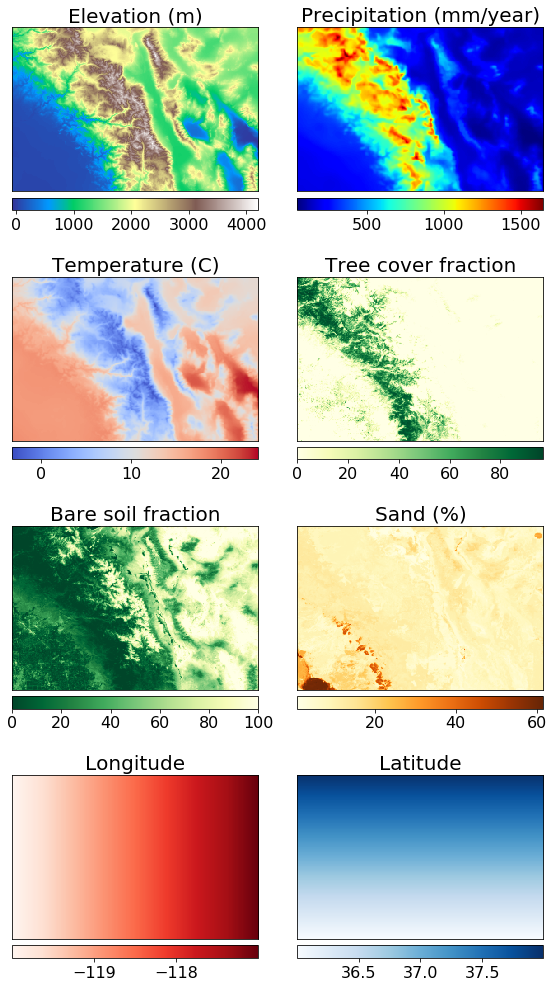

#### 1. Run K-means on the data

In [ ]:
#Bring in the data
X = []
for var in data:
    tmp = data[var].reshape(data[var].size)
    X.append(tmp)
X = np.array(X).T
#Normalize the data
Xn = (X - np.min(X,axis=0))/(np.max(X,axis=0)-np.min(X,axis=0))
#Define the number of clusters
k = 100
np.random.seed(1)
model = sklearn.cluster.KMeans(n_clusters=k)
#Subsample data to fit the model (minimize computation)
idx = np.random.choice(np.arange(Xn.shape[0]), 5000, replace=False)
Xns = Xn[idx,:]
#Fit the model
model.fit(Xns)
#Predict the clusters on all the data
clusters = model.predict(Xn)

#### 2. Reproduce the original maps

In [ ]:
#Assign the cluster centroid values to each cluster
Xpred = np.copy(X)
for i in range(k):
    m = clusters == i
    Xpred[m,:] = np.mean(X[m,:],axis=0)
#Reproduce the data
data_pred = {}
i = 0
for var in data:
    data_pred[var] = Xpred[:,i].reshape(data[var].shape)
    i += 1
#Create a figure comparing them
i = 0
plt.figure(figsize=(10,30))
for var in data:
    print(var)
    vmin = np.min(data[var])
    vmax = np.max(data[var])
    i += 1
    plt.subplot(8,2,i)
    plt.imshow(data[var],vmin=vmin,vmax=vmax,cmap=plt.get_cmap(info[var]['cmap']))
    plt.ylabel(info[var]['title'],fontsize=16)
    if i == 1:plt.title('Original',fontsize=20)
    plt.xticks([])
    plt.yticks([])
    cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.70)
    cb.ax.tick_params(labelsize=16)
    i += 1
    plt.subplot(8,2,i)
    if i == 2:plt.title('Reproduced for k=%i' % k,fontsize=20)
    plt.imshow(data_pred[var],vmin=vmin,vmax=vmax,cmap=plt.get_cmap(info[var]['cmap']))
    plt.xticks([])
    plt.yticks([])
    cb = plt.colorbar(orientation='horizontal',pad=0.03,shrink=0.70)
    cb.ax.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

#### 3. Compare each reproduced grid cell to its original value

In [ ]:
# root mean square error
def calculate_rmse(model,obs):
    return np.mean((model - obs)**2)**0.5
# absolute bias
def calculate_abias(model,obs):
    return np.mean(np.abs(model-obs))

for var in data:
    original = data[var]
    reproduced = data_pred[var]
    rmse = calculate_rmse(reproduced,original)
    abias = calculate_abias(reproduced,original)
    print('%s:, rmse:%f, abias:%f' % (info[var]['title'],rmse,abias))

# Let's think about this...

* Original maps: 60,000 pixels
* Number of maps: 8
* Total number of pixels: 480,000 pixels
* Reduced down to: 8*100 centroids
* Compression: ~1000 times
* But we trade compression for error...

# But how do we determine the optimal number of clusters?

## Approach #1: Elbow Method

The **Elbow Method** is a technique used to determine the optimal number of clusters (**k**) in K-Means clustering. It helps find the best balance between minimizing inertia (within-cluster sum of squares) and avoiding overfitting.

### **Steps for the Elbow Method:**
1. **Train K-Means** on the dataset with different values of `k` (e.g., from 1 to 25).
2. **Calculate the inertia (WCSS)** for each `k`, where:
   - WCSS (Within-Cluster Sum of Squares) measures the compactness of clusters.
3. **Plot inertia vs. `k`** and look for an "elbow point".
4. **Identify the optimal `k`**, which is where the WCSS starts to level off, forming an "elbow" shape.


The **inertia** (or **WCSS**) in K-Means clustering is given by:

$$
WCSS = \sum_{i=1}^{k} \sum_{x \in C_i} ||x - \mu_i||^2
$$

Where:
- $k$ = number of clusters
- $C_i$ = set of points in cluster $i$
- $\mu_i$ = centroid of cluster $i$
- $||x - \mu_i||^2$ = squared Euclidean distance between each point $x$ and its cluster centroid

The goal of K-Means is to minimize $WCSS$, ensuring compact clusters.

In [ ]:
maxk = 25
WCSS = []
for k in range(1,maxk+1):
    print('computing for k=%i' % k)
    model = sklearn.cluster.KMeans(n_clusters=k)
    #Subsample data to fit the model (minimize computation)
    np.random.seed(1)
    idx = np.random.choice(np.arange(Xn.shape[0]),5000, replace=False)
    Xns = Xn[idx,:]
    #Fit the model
    model.fit(Xns)
    #Memorize the sum of squared errors 
    WCSS.append(model.inertia_)

In [ ]:
# Plot Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, maxk + 1), SSE, marker='o', linestyle='-', label="WCSS")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("WCSS")
plt.title("Elbow Method for Optimal k")
plt.legend()
plt.show()


## Approach #2: 

Define a metric that compares how close the computed clusters are able to reproduce the original maps. Note that it could be the absolute bias, the RMSE, or the WCSS (inertia term) itself. 

However, in this case, we want to ensure that each variable satisifies our predefined threshold. 

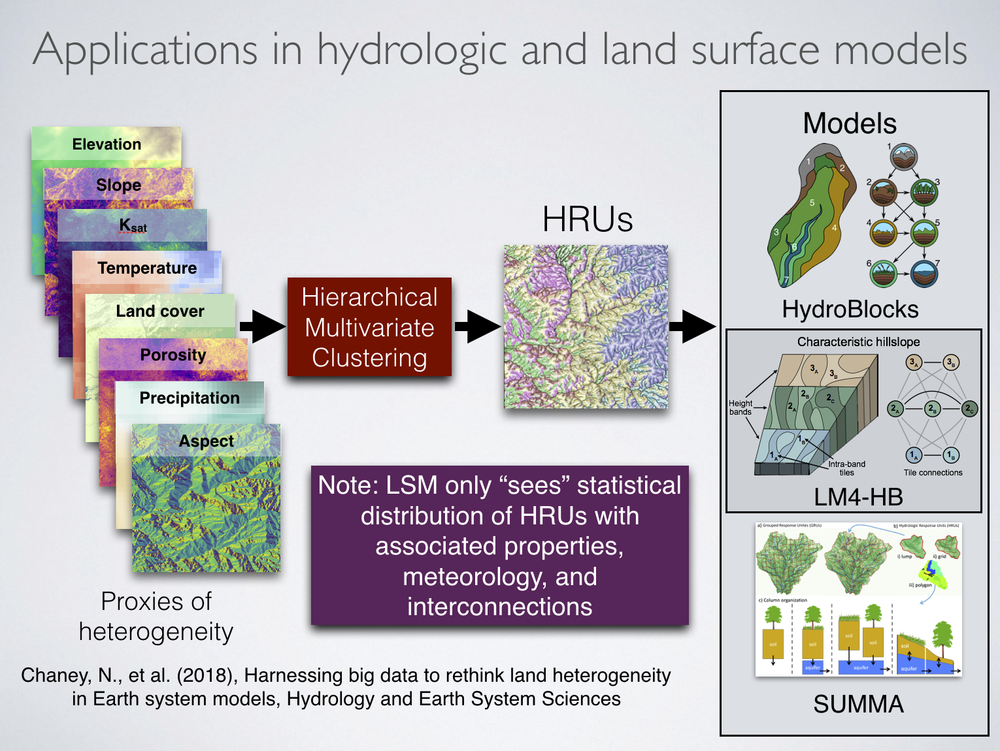

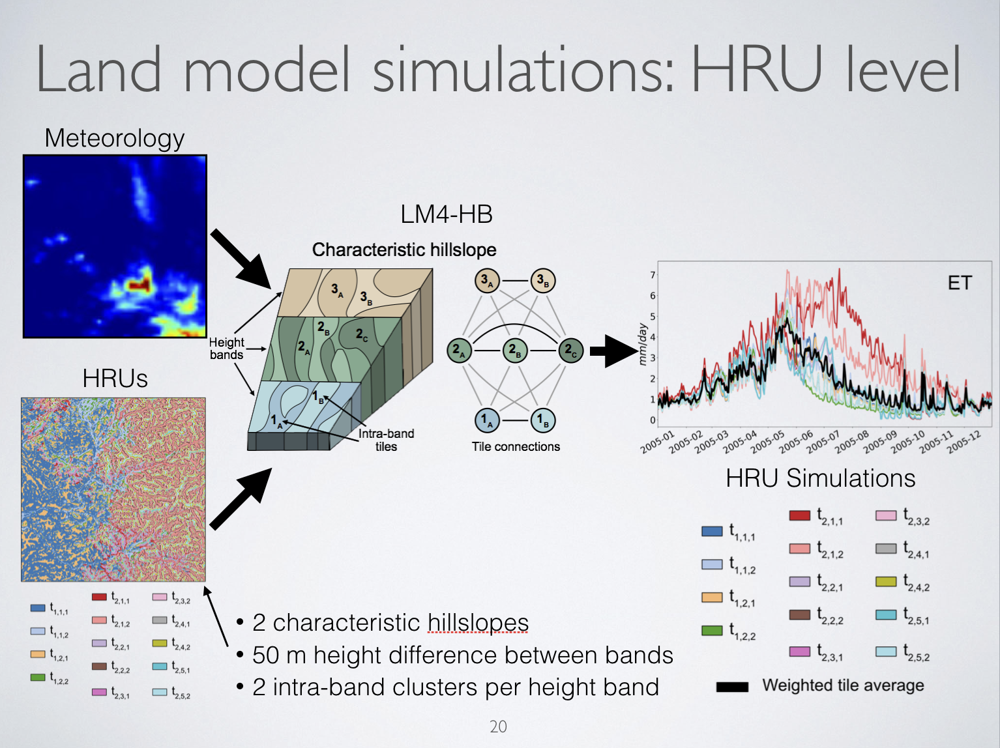

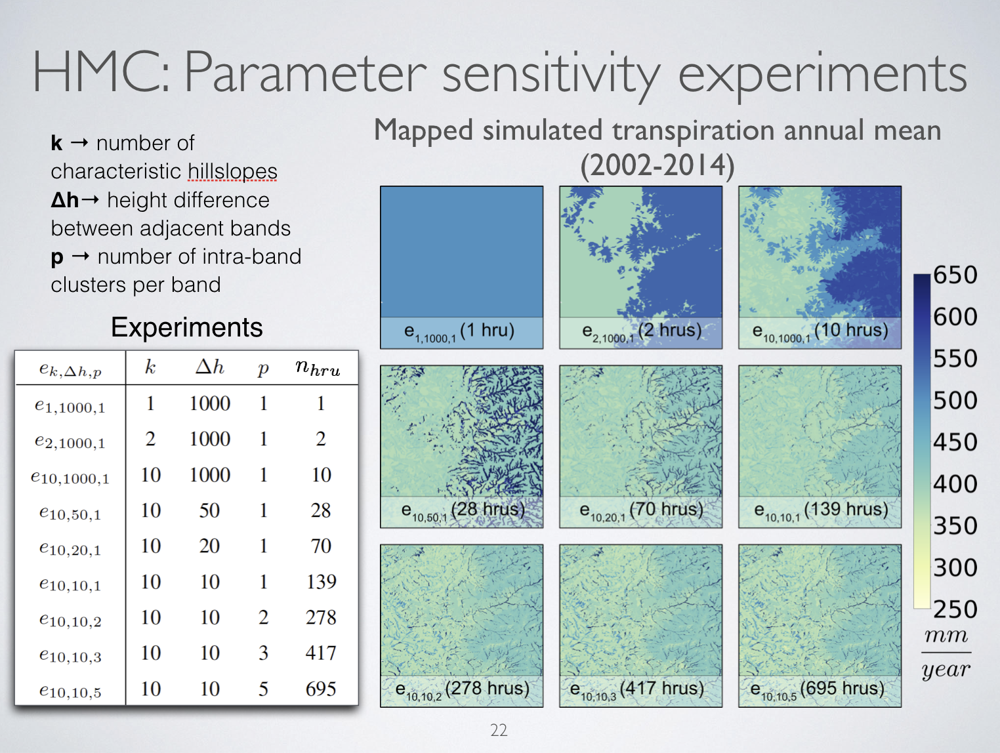

# K-Means summary I

### Characteristics:
* Exclusive - Each data point is assigned to only one cluster
* Partitional - It divides the n-dimensional space into k non-overlapping clusters
* Complete - Each data point is assigned to a cluster

# K-Means summary II

### Pros:
* Computationally efficient and scalable
* Great for partitioning the data (vector quantization)
* Excellent for data compression

### Cons:
* Only finds local minima (centroid initialization is a problem)
* As a clustering algorithm, it is only really suitable for spherical shapes of similar magnitudes.
* There is no "cluster belonging" weights (i.e., probabilities) computed. This makes assigning border data points very challenging.